# Store Sales Forecasting

### Modules Needed

In [1]:
%reset -f

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import warnings 
import matplotlib.dates as mdates

from category_encoders import MEstimateEncoder
from datetime import datetime
from sklearn.feature_selection import mutual_info_regression
from darts import TimeSeries
from darts.models import LightGBMModel
from darts.dataprocessing.transformers import Scaler
from darts.metrics import rmse

warnings.filterwarnings('ignore')


c:\Users\hp\darts-env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Data Import and Merging

In [3]:
train_x = pd.read_csv("train.csv")
test_x = pd.read_csv("test.csv")
oil = pd.read_csv("oil.csv")
store = pd.read_csv("stores.csv")
transactions = pd.read_csv("transactions.csv")
holiday = pd.read_csv("holidays_events.csv")

In [4]:
#prep for merger 
train_x["dataset"] = 0
test_x["dataset"] = 1

train = pd.concat([train_x,test_x], axis=0).copy()

In [5]:
#Function to merge datasets across test and train data
def data_merge(data):
    data = pd.merge(data,oil, on="date", how="left")
    data = pd.merge(data,store, on="store_nbr", how="left")
    data = pd.merge(data,transactions, on=["date","store_nbr"], how="left")
    data = pd.merge(data,holiday, left_on=["date","city"], right_on=["date","locale_name"], how="left")
    data = data.set_index(['store_nbr', 'date', 'family'])
    
    return data

train = data_merge(train)
train = train.drop(index='2013-01-01', level=1).reset_index()

#### Sort dataset based key variables

In [6]:
train = train.sort_values(["store_nbr","family","date"])

#### Casting Columns types

In [7]:
def object_cat (df):
    for column, type in zip(df.columns,df.dtypes):
        if column == "cluster":
            pass
            #df[column] = df[column].astype("category")
        elif column == "date":
            df["date"] = pd.to_datetime(df["date"], errors="coerce") 
        if type == "object" and column != "date":
            df[column] = df[column].astype("category")
    return df

train = object_cat(train)

#### Create Time Step Feature

In [8]:
train['time_step'] = train['date'].rank(method="dense", ascending=True).astype(int)

#### Generate List for categorical and numeric columns

In [9]:
cat_col = [x for x, y in zip(train.columns, train.dtypes) if y in ["object", "category","bool"] and x != "date"]
num_col = [x for x, y in zip(train.columns, train.dtypes) if y not in ["object", "category","bool"] and x not in ["id","date","family","dataset"]]


#### Creation of Train X and Y

In [10]:
train = train.set_index("id")
train_x = train[train["dataset"]==0].copy()

test_x = train[train["dataset"]==1].copy()
train_explore = train_x.copy()



### Dealing with Missing Values and Column Types

In [11]:
# Missing oil data filled with mean of 3 days window  and others filled with zero or Unknown
def fill_na_groups(train_xx):
    train_xx["dcoilwtico"] = train_xx.groupby(["store_nbr"])["dcoilwtico"].transform(lambda x: x.fillna(x.rolling(3, min_periods=1).mean()))
    train_xx["dcoilwtico"] = train_xx.groupby(["store_nbr" ])["dcoilwtico"].transform(lambda x: x.bfill())
    train_xx[num_col] = train_xx[num_col].fillna(0)
    

    return train_xx

train_x = fill_na_groups(train_x)
test_x = fill_na_groups(test_x)
train_explore = fill_na_groups(train_explore)



### Exploratory Analysis

 #### Numeric Columns

##### Histogram and Scatterplot

In [12]:
train_explore1 = train_explore[train_explore["date"] <="2024-01-01"]

#### Line Plot and Regression Plot

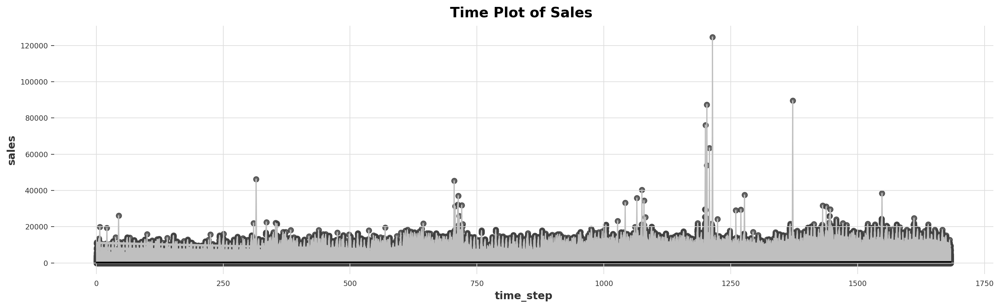

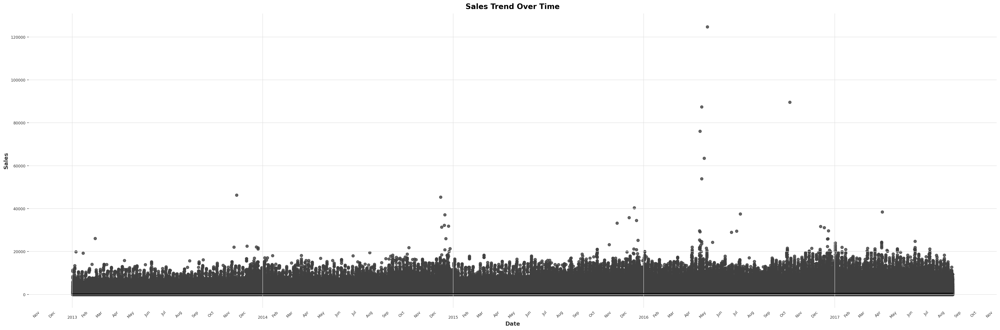

In [13]:
#plt.style.use("seaborn-whitegrid")
plt.rc(
    "figure",
    autolayout=True,
    figsize=(16, 5),
    titlesize=18,
    titleweight='bold',
)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

fig, ax = plt.subplots()

ax.plot('time_step', 'sales',data=train_explore[num_col], color='0.75')
ax =sns.regplot(x='time_step', y='sales', data=train_explore[num_col], ci=None, scatter_kws=dict(color='0.25'),)
ax.set_title(f'Time Plot of Sales ');

# Plot
train_explore["date_ordinal"] = train_explore["date"].map(mdates.date2num)
fig, ax = plt.subplots(figsize=(30, 10))
sns.regplot(x="date_ordinal", y="sales", data=train_explore, ci=None, scatter_kws={"color": "0.25"}, ax=ax)

# Format x-axis
ax.xaxis.set_major_locator(mdates.YearLocator(1))  
ax.xaxis.set_minor_locator(mdates.MonthLocator())  
ax.xaxis.set_major_formatter(mdates.DateFormatter("\n%Y"))  
ax.xaxis.set_minor_formatter(mdates.DateFormatter("%b"))  
 

# Rotate month labels
plt.setp(ax.get_xticklabels(minor=True), rotation=45, ha="right")

plt.xticks(rotation=0)  
plt.xlabel("Date")
plt.ylabel("Sales")
plt.title("Sales Trend Over Time")

plt.show()


##### Line plot of Sales Aggregates

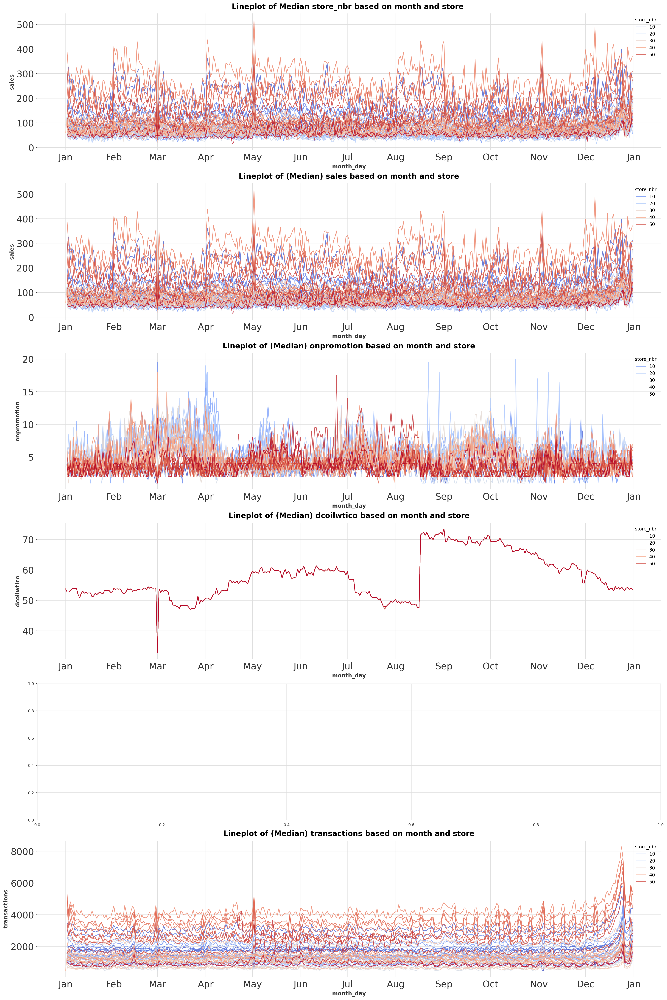

In [14]:
#display(num_col) #display(cat_col).
train_explore["month_day"] = train_explore["date"].dt.strftime("%m-%d") 
fig, axes = plt.subplots(6, 1, figsize=(20,5*6), constrained_layout=True)

for ax, x in zip(axes,train_explore[[col for col in num_col if col != "time_step"]].columns) :

    if x == "store_nbr":
        sns.lineplot(x="month_day", y="sales", ax=ax,alpha=0.8, palette="coolwarm", hue ="store_nbr",
        data=train_explore.loc[train_explore["sales"] != 0].groupby(["month_day","store_nbr"])["sales"].median().reset_index(), )
        ax.set_title(f"Lineplot of Median {x} based on month and store ")
        ax.xaxis.set_major_locator(mdates.MonthLocator())  # Show one tick per month
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%b"))
        ax.tick_params(axis='both', labelsize=20)
    elif x =="cluster":
        pass
    else:
        sns.lineplot(x="month_day", y=x, ax=ax,alpha=0.8, palette="coolwarm", hue ="store_nbr",
        data=train_explore.loc[train_explore[x] != 0].groupby(["month_day","store_nbr"])[x].median().reset_index(), )
        ax.set_title(f"Lineplot of (Median) {x} based on month and store")
        ax.xaxis.set_major_locator(mdates.MonthLocator())  # Show one tick per month
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%b"))
        ax.tick_params(axis='both', labelsize=20)


##### Heatmap

In [15]:
train_explore["month"] = train_explore["date"].dt.strftime("%m") 
train_explore2 = train_explore[train_explore["date"] <= "2013-01-15"]

##### Analysis of Top 10  Performing Store in terms of Total Sales

In [16]:
train_sales = pd.DataFrame(train_explore.loc[train_explore["sales"] != 0].groupby(["store_nbr"])["sales"].sum().reset_index())
top10= train_sales.sort_values("sales", ascending=False)[:10]
top10stores=top10["store_nbr"].to_numpy() 
train_top10 = train_explore[train_explore["store_nbr"].isin(top10stores)]
sorted(top10stores)

[3, 8, 44, 45, 46, 47, 48, 49, 50, 51]

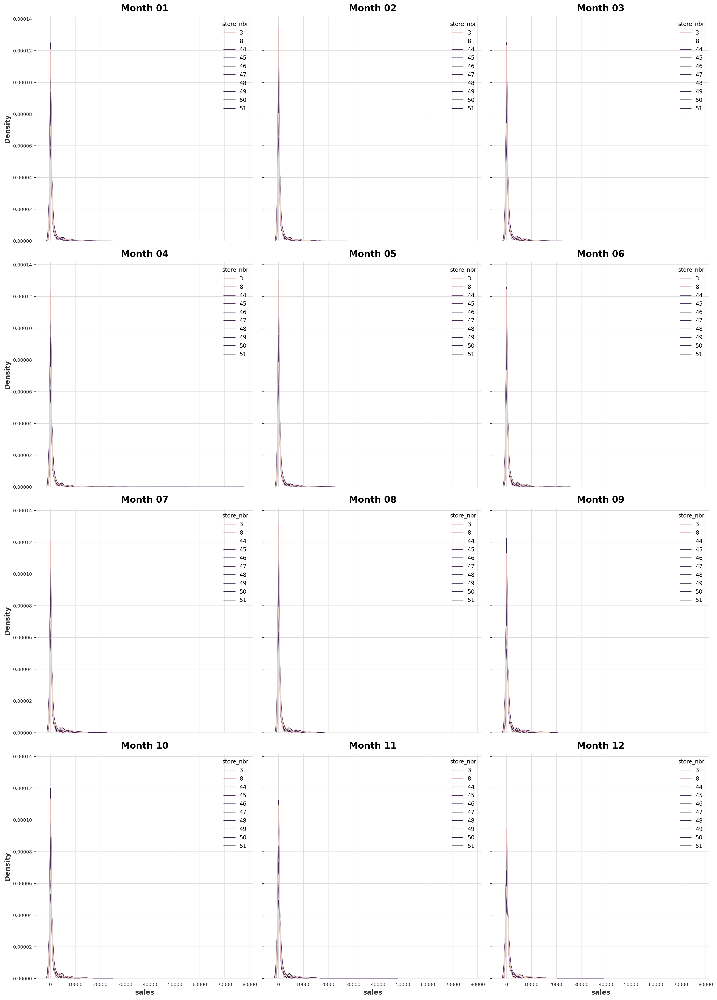

In [17]:
train_explore2 = train_top10 #[train_top10["date"] <= "2020-01-31"]

# Split top 10 stores into two sets
top5_stores = train_top10["month"].unique()

# Create a single figure with subplots (2 columns for side-by-side placement)
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 25), sharex=True, sharey=True, constrained_layout=True)

# Flatten axes for easier iteration
axes = axes.flatten()

for i, store in enumerate(top5_stores):
    sns.kdeplot(data=train_explore2[train_explore2["month"] == store], 
                x="sales", hue="store_nbr", ax=axes[i],)
    axes[i].set_title(f"Month {store}")

plt.tight_layout()
plt.show()

###### The plot shows sales distributions by store across all 12 months. Sales are highly right-skewed with most values clustered near zero and occasional high outliers. The distribution shape is consistent, suggesting stable seasonality with some store-specific spikes. This might call the need to do a log transformation on sales to reduce skewness (np.log1p) and reconversion (np.expm1) post analysis

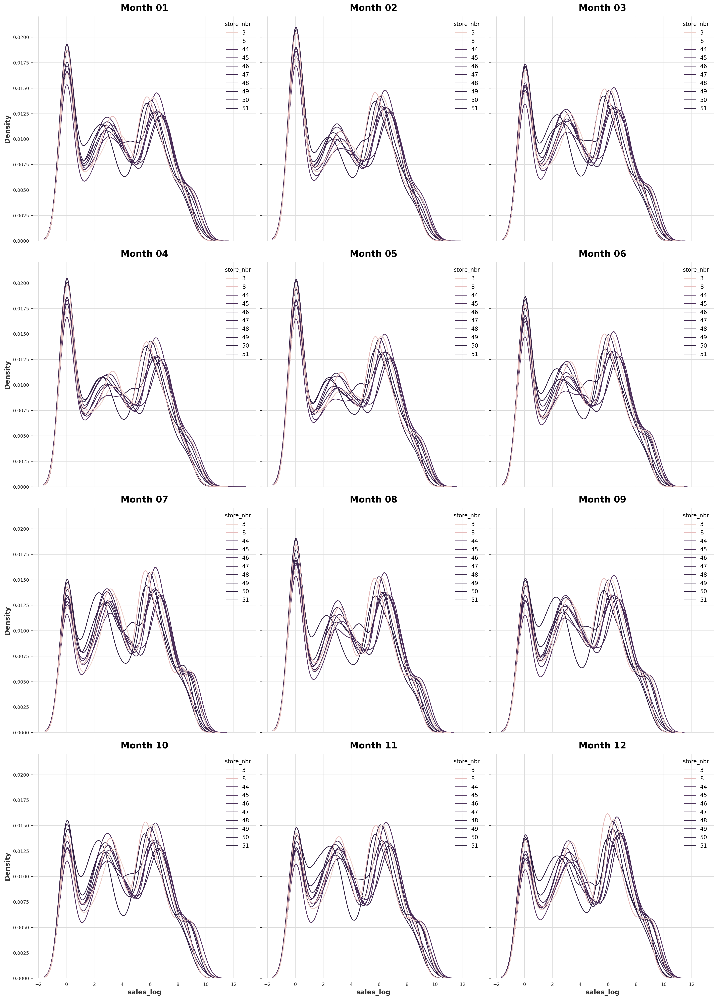

In [18]:
# Create a single figure with subplots (2 columns for side-by-side placement)
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 25), sharex=True, sharey=True, constrained_layout=True)

# Flatten axes for easier iteration
axes = axes.flatten()

train_explore2["sales_log"] = np.log1p(train_explore2["sales"])

for i, store in enumerate(top5_stores):
    sns.kdeplot(data=train_explore2[train_explore2["month"] == store], 
                x="sales_log", hue="store_nbr", ax=axes[i],)
    axes[i].set_title(f"Month {store}")

plt.tight_layout()
plt.show()

###### After log transformation (`sales_log`), the sales distributions across stores and months appear more symmetric and multi-modal, with reduced skewness. Peaks are better aligned across stores, indicating improved comparability and stabilized variance ideal for modeling.

In [19]:
#%reset -f

### Darts ANalysis

In [ ]:
categorical_cols = train_x.select_dtypes(include=["category"]).columns.tolist()

print("Categorical columns:train_x", categorical_cols,)


#Encode wide family feature 
encoder = MEstimateEncoder(cols=categorical_cols, m=5.0)

y_train = train_x["sales"].copy()
y_test = test_x["sales"].copy()

encoder.fit(train_x.drop(columns=["sales"]), train_x["sales"])
train_x = encoder.transform(train_x.drop(columns=["sales"]))
test_x = encoder.transform(test_x.drop(columns=["sales"]))

train_x["sales"] = y_train.values
test_x["sales"] = y_test.values

In [ ]:
train_x1 = train_x.copy()

sales =train_x1.pop("sales")
for colname in train_x1[cat_col].select_dtypes(["object","category"]):
    train_x1[colname], _ = train_x1[colname].factorize()

for colname in train_x1.select_dtypes(["datetime"]):
    train_x1[colname] = train_x1[colname].astype("int64") // 10**9  # Convert to seconds since epoch

# All discrete features should now have integer dtypes 
discrete_features = train_x1.dtypes == np.int64
discrete_features

In [ ]:

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(train_x1, sales, discrete_features=discrete_features)
print(mi_scores[::3])  # show a few features with their MI scores

def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")


plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

In [ ]:
mi_scores1 = pd.Series(mi_scores, index=train_x.columns)
selected_columns = train_x.columns[(mi_scores1 > 0.01)].tolist() 
            
# Remove the 'transactions' column if it exists as will cause data leakeage in future predictions given its unknown
selected_columns = [col for col in selected_columns if col not in ['transactions']] + ["sales"]
train_x.loc[:,selected_columns].head()

In [ ]:
train_x1 = train_x[selected_columns].copy()
test_x1 = test_x[selected_columns].copy()


train_x1['date'] = pd.to_datetime(train_x1['date'])
test_x1['date'] = pd.to_datetime(test_x1['date'])

all_preds = []

for (store, family), group_train in train_x1.groupby(["store_nbr", "family"]):
    group_test = test_x1[(test_x1["store_nbr"] == store) & (test_x1["family"] == family)]

    full_df = pd.concat([
        group_train[['date', 'sales']],
        group_test[['date']].assign(sales=np.nan)
    ])

    # Remove duplicates by date (if any)
    full_df = full_df.drop_duplicates(subset='date', keep='first')

    try:
        series = TimeSeries.from_dataframe(
            full_df,
            time_col='date',
            value_cols='sales',
            fill_missing_dates=True,
            freq="D"
        )
    except Exception as e:
        print(f"Skipping store {store}, family {family} due to error: {e}")
        continue

    scaler = Scaler()
    series_log = series.map(np.log1p)
    series_scaled = scaler.fit_transform(series_log)


    # Split using the last known date
    split_point = group_train['date'].max()
    train_series = series_scaled.drop_after(split_point)
    train_series = train_series.with_values(np.nan_to_num(train_series.values(), nan=0.0))



    model = LightGBMModel(lags=[-7,-15,-30], output_chunk_length=len(group_test),
                          verbose=-1
        )
    model.fit(train_series)

    forecast = model.predict(len(group_test))
    forecast_final = scaler.inverse_transform(forecast).map(np.expm1)


    # Store with identifying columns
    df_preds = group_test[['store_nbr', 'family', 'date']].copy()
    df_preds['predicted_sales'] = forecast_final.values().flatten()
    all_preds.append(df_preds)

    print(f"Completed store {store}, family {family}")

# Final predictions
predictions_df = pd.concat(all_preds).sort_values(['store_nbr', 'family', 'date'])



In [ ]:
res = pd.DataFrame({#"idx":predictions_df.index,
                    "sales": predictions_df["predicted_sales"]})

res = res.reset_index()
res = res.sort_values("id")
res.to_csv('submission.csv', index=False)
res.head(10)

Model Achieved an accuracy of above 90% as of this Version 1